In [52]:
# from mse_2D_C import mse_2D, mse_2D_one_image, rgb_mse_2D_one_image
from mse_2D_C import mse_2D, mse_2D_one_image, rgb_mse_2D_one_image
from PIL import Image
from skimage import io, transform
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import cv2

In [69]:
def calcular_area_bajo_curva(escalas, entropias):
    n = len(escalas)
    area = 0.0

    for i in range(1, n):
        base = escalas[i] - escalas[i-1]
        altura_promedio = (entropias[i] + entropias[i-1]) / 2
        area += base * altura_promedio

    return area

def calcular_grafico_entropia_multiescala(mse_values):
    # Implementa aquí la generación del gráfico de entropía multiescala para la imagen
    # Puedes utilizar tu método previo para calcular los valores de entropía en diferentes escalas

    # Retorna el gráfico de entropía multiescala
    grafico_entropia = np.array(mse_values)
    return grafico_entropia

def normalizar_grafico_entropia(grafico):
    # Normaliza los valores de entropía en el gráfico utilizando una técnica de normalización
    min_val = np.min(grafico)
    max_val = np.max(grafico)
    if max_val - min_val != 0:
        grafico_normalizado = (grafico - min_val) / (max_val - min_val)
    else:
        grafico_normalizado = grafico
    return grafico_normalizado

def calcular_similitud(grafico1, grafico2):
    # Utiliza la distancia Euclidiana como medida de similitud
    return np.linalg.norm(grafico1 - grafico2)

def clasificar_graficos_entropia(imagenes, umbral_similitud):
    n = len(imagenes)
    resultados = []

    for i in range(n):
        grafico_i = calcular_grafico_entropia_multiescala(imagenes[i])
        grafico_i_normalizado = normalizar_grafico_entropia(grafico_i)
        clasificacion = []

        for j in range(i+1, n):
            grafico_j = calcular_grafico_entropia_multiescala(imagenes[j])
            grafico_j_normalizado = normalizar_grafico_entropia(grafico_j)
            similitud = calcular_similitud(grafico_i_normalizado, grafico_j_normalizado)

            if similitud > umbral_similitud:
                clasificacion.append(j)  # Indica que el gráfico j es similar al gráfico i

        resultados.append(clasificacion)

    return resultados

def coarse_graining(image, scale):
    # Obtener las dimensiones de la imagen original

    try:
        rows, cols, _ = image.shape
    except:
        rows, cols = image.shape

    # Calcular el nuevo tamaño de la imagen después de aplicar coarse graining
    new_rows = rows // scale
    new_cols = cols // scale

    # Crear una nueva matriz para almacenar la imagen coarse-grained
    coarse_image = np.zeros((new_rows, new_cols))

    # Aplicar el proceso de coarse graining
    for i in range(new_rows):
        for j in range(new_cols):
            # Calcular el promedio de los píxeles en la región de la imagen original correspondiente
            region = image[i*scale:(i+1)*scale, j*scale:(j+1)*scale]
            average = np.mean(region)
            
            # Asignar el valor promedio a la posición correspondiente en la imagen coarse-grained
            coarse_image[i, j] = average

    return coarse_image

def plot_coarse_grained_image(image, num_scales):
    fig, axs = plt.subplots(2, 4, figsize=(12, 8))

    for i, ax_row in enumerate(axs):
        for j, ax in enumerate(ax_row):
            scale = i * 4 + j + 2  # Escala desde 2 hasta 9
            scaled_image = coarse_graining(image, scale)
            ax.imshow(scaled_image, cmap='gray')
            # cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)
            ax.set_title("Coarse-Grained: Scale " + str(scale))
            ax.axis("off")

    plt.tight_layout()
    plt.show()
    plt.close()

# Imágenes

In [12]:
list_mse = []
list_images = []
list_areas = []

In [13]:
folder_path = r'datos\2D\imagenes_prueba'

### Redimensionamos todas las imágenes a 100x100

In [50]:
for filename in os.listdir(folder_path):
    try:
        file_path = os.path.join(folder_path, filename)
        image = io.imread(file_path)
        image_resized = transform.resize(image, (100, 100), anti_aliasing=True)
        
        path_save = r'datos\2D\imagenes_redimensionadas\{}'.format(filename)
        io.imsave(path_save, image_resized)
    
    except AttributeError as error:
        print(error)
        continue


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

### I- Calculamos las MSE (sin Fuzzy Entropy) para cada imagen redimensionada:

In [15]:
folder_path = r'datos\2D\imagenes_redimensionadas'

In [16]:
scales = 12
m = 1
r = 0.5
delta = 0.8
fuzzy = False
distance_type = 0

In [20]:
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    mse_values = mse_2D_one_image(file_path, scales, m, r, delta, fuzzy, distance_type)
    grafico_entropia = calcular_grafico_entropia_multiescala(mse_values)
    area = calcular_area_bajo_curva([i for i in range(1, scales+1)], mse_values)

    list_mse.append(mse_values)
    list_images.append(filename)
    list_areas.append(area)

### Graficamos las MSE para cada imagen y su respectiva imagen redimensionada

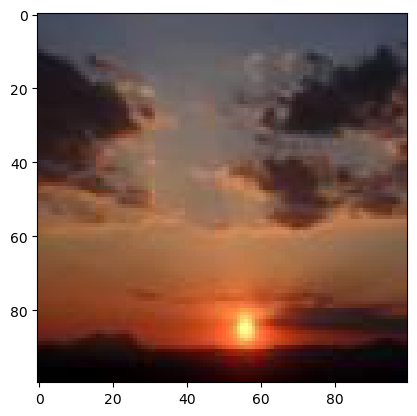

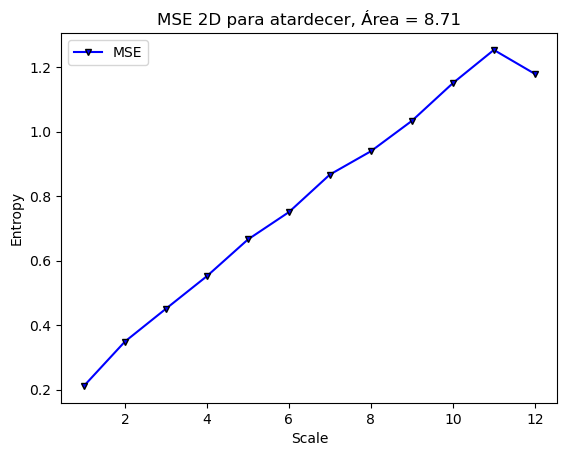

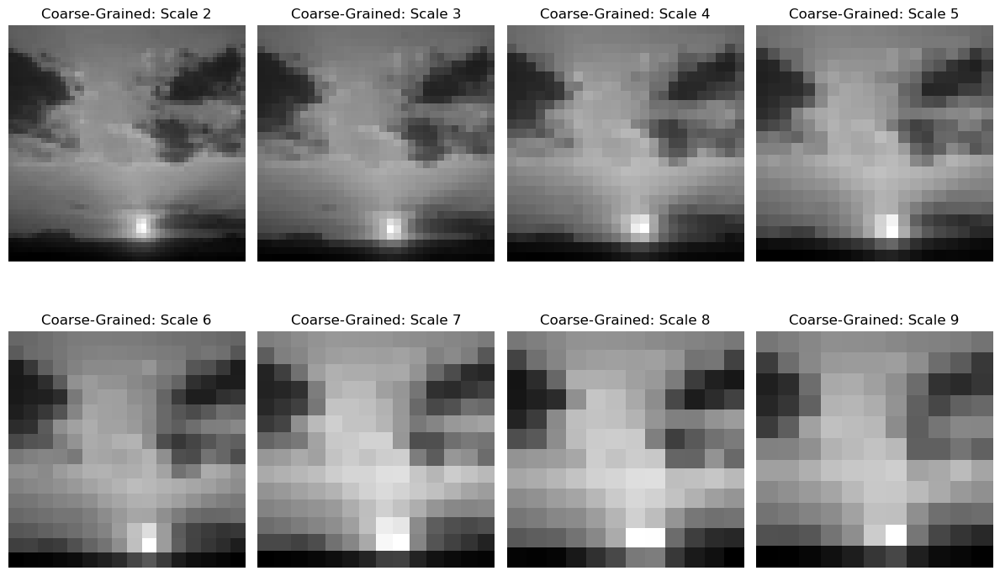

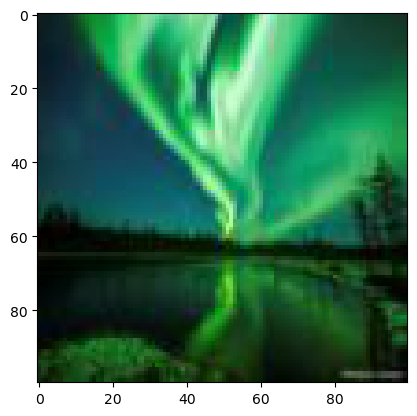

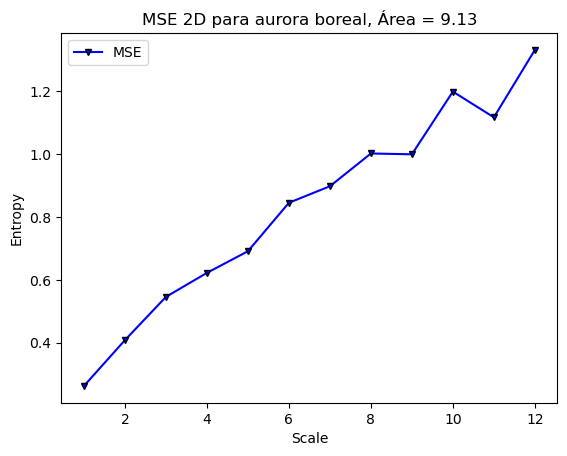

...

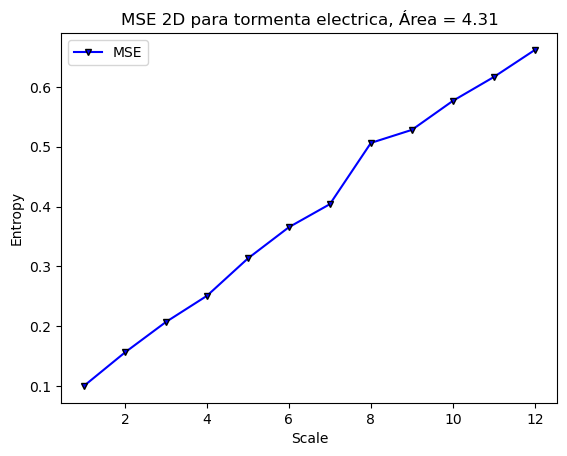

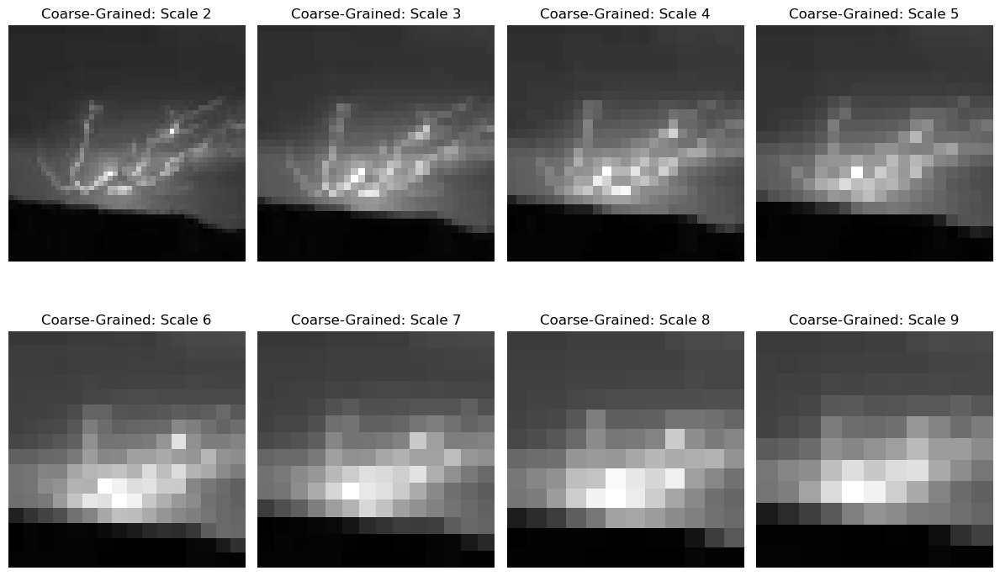

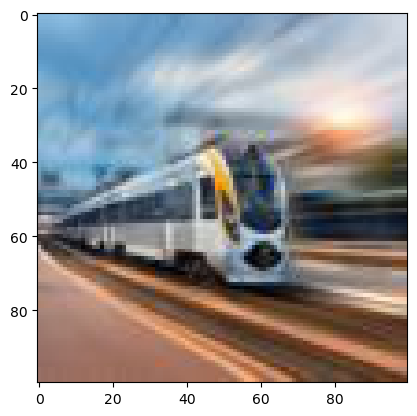

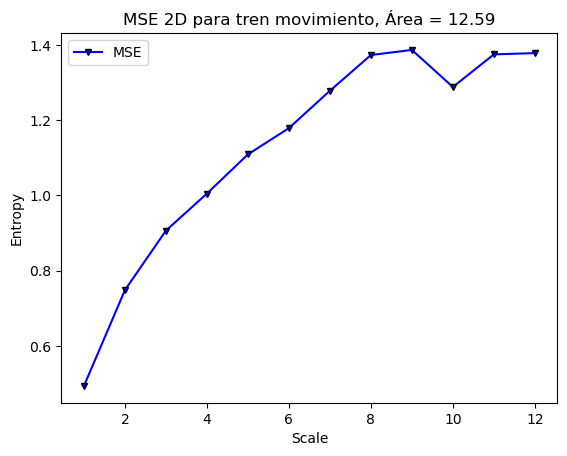

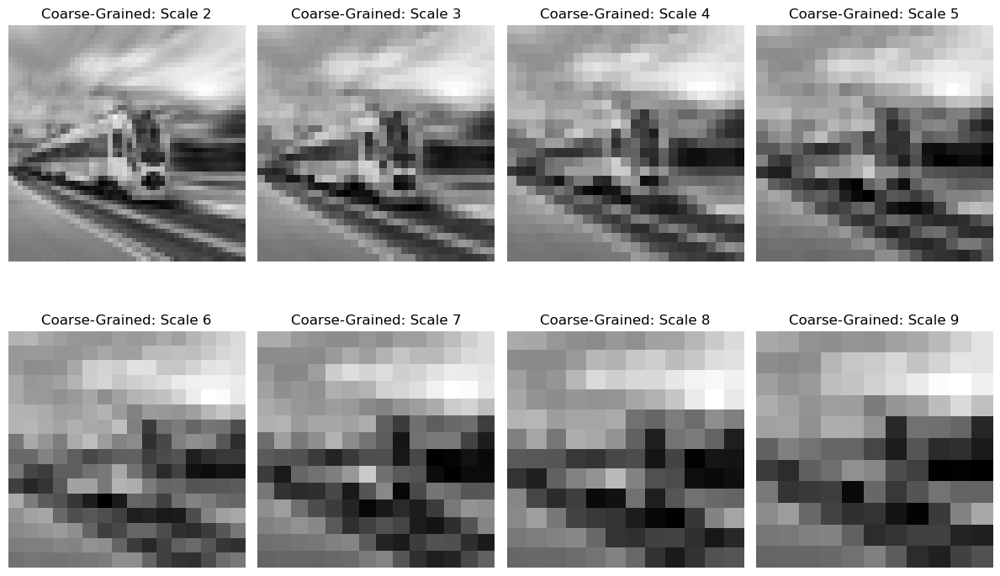

In [71]:
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    area = list_areas[list_images.index(filename)]
    mse_values = list_mse[list_images.index(filename)]
    
    plt.imshow(image)
    plt.show()

    plt.plot(range(1, len(mse_values) + 1), mse_values, color='blue', marker='v', markersize=5, markeredgecolor='black', label='MSE')

    name_title = filename.replace('.jpg', '')
    name_title = name_title.replace('.png', '')
    name_title = name_title.replace('.jpeg', '')
    name_title = name_title.replace('_', ' ')
    plt.title(f'MSE 2D para {name_title}, Área = {area:.2f}')

    plt.xlabel('Scale')
    plt.ylabel('Entropy')
    plt.legend()
    plt.show()
    
    # Cerrar la ventana de la imagen para continuar con la siguiente
    plt.close()

    plot_coarse_grained_image(image, scales)

### Agrupación de gráficos con comportamiento similar

In [72]:
def normalizar_grafico_entropia(grafico):
    # Normaliza los valores de entropía en el gráfico utilizando una técnica de normalización
    min_val = np.min(grafico)
    max_val = np.max(grafico)
    if max_val - min_val != 0:
        grafico_normalizado = (grafico - min_val) / (max_val - min_val)
    else:
        grafico_normalizado = grafico
    return grafico_normalizado

def calcular_similitud(grafico1, grafico2):
    # Utiliza la distancia Euclidiana como medida de similitud
    return np.linalg.norm(grafico1 - grafico2)

def clasificar_graficos_entropia(imagenes, umbral_similitud):
    n = len(imagenes)
    resultados = []

    for i in range(n):
        grafico_i = calcular_grafico_entropia_multiescala(imagenes[i])
        grafico_i_normalizado = normalizar_grafico_entropia(grafico_i)
        clasificacion = []

        for j in range(i+1, n):
            grafico_j = calcular_grafico_entropia_multiescala(imagenes[j])
            grafico_j_normalizado = normalizar_grafico_entropia(grafico_j)
            similitud = calcular_similitud(grafico_i_normalizado, grafico_j_normalizado)

            if similitud > umbral_similitud:
                clasificacion.append(j)  # Indica que el gráfico j es similar al gráfico i

        resultados.append(clasificacion)

    return resultados

In [117]:
from sklearn.cluster import KMeans

def graph_clustering(graphs, num_clusters):
    # Convertir los gráficos a una matriz de características
    features = np.array(graphs)

    # Crear el modelo de clustering
    kmeans = KMeans(n_clusters=num_clusters)

    # Ajustar el modelo a los datos de entrada
    kmeans.fit(features)

    # Obtener las etiquetas de los clusters asignados a cada gráfico
    cluster_labels = kmeans.labels_

    # Crear un diccionario para almacenar los gráficos por cluster
    clusters = {}

    # Iterar sobre los gráficos y asignarlos a los clusters correspondientes
    for graph_id, label in enumerate(cluster_labels):
        if label not in clusters:
            clusters[label] = []
        clusters[label].append(graphs[graph_id])

    # Devolver el diccionario de clusters
    return clusters

In [130]:
# Gráficos con su respectiva imagen
list_images_mse = list(zip(list_images, list_mse))
cluster_graficos = graph_clustering(list_mse, 6)

c:\Users\adolf\anaconda3\envs\Geopandas\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\adolf\anaconda3\envs\Geopandas\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [119]:
def plot_clusters(clusters):
    # Crear un colormap para asignar colores a los clusters
    colormap = plt.cm.get_cmap('tab10', len(clusters))

    # Iterar sobre los clusters y sus gráficos correspondientes
    for cluster_id, graph_list in clusters.items():
        # Obtener las coordenadas x e y de los gráficos
        x = [graph[0] for graph in graph_list]
        y = [graph[1] for graph in graph_list]

        # Graficar los puntos correspondientes al cluster con un color asignado
        plt.scatter(x, y, color=colormap(cluster_id), label=f'Cluster {cluster_id}')

    # Mostrar leyenda y título
    plt.legend()
    plt.title('Clustering de gráficos')

    # Mostrar el scatter plot
    plt.show()

<ipython-input-119-895859bff1c1>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(clusters))


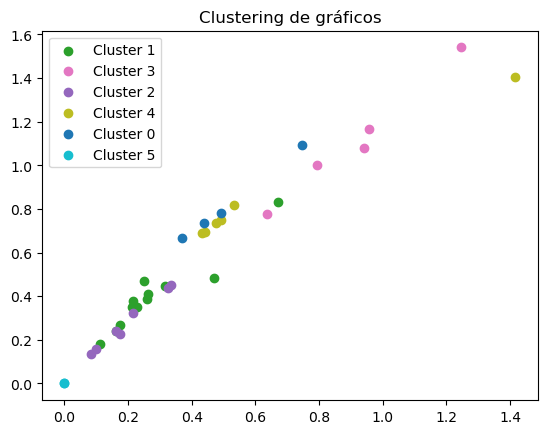

In [120]:
# Mostrar los clusters
plot_clusters(cluster_graficos)

In [140]:
def encontrar_imagen(grafico, lista):
    for imagen, grafico_imagen in lista:
        if grafico == grafico_imagen:
            return imagen
        
def mostrar_graficos_cluster(cluster, imagenes):
    num_graficos = len(cluster)
    num_filas = 2
    num_columnas = 4
    
    fig, axs = plt.subplots(num_filas, num_columnas, figsize=(12, 8))
    axs = axs.flatten()
    
    for i, ax in enumerate(axs):
        if i < num_graficos:
            grafico = cluster[i]
            imagen = encontrar_imagen(grafico, list_images_mse)
            ax.plot(grafico)
            # ax.set_title(f"Grafico {indice_grafico}")
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

def mostrar_imagenes_cluster(cluster, imagenes):
    num_graficos = len(cluster)
    num_filas = 2
    num_columnas = 4
    
    fig, axs = plt.subplots(num_filas, num_columnas, figsize=(12, 8))
    axs = axs.flatten()
    
    for i, ax in enumerate(axs):
        if i < num_graficos:
            grafico = cluster[i]
            imagen = encontrar_imagen(grafico, list_images_mse)
            imagen_path = os.path.join(folder_path, imagen)
            image = io.imread(imagen_path)
            ax.imshow(image)
            # ax.set_title(f"Grafico {indice_grafico}")
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

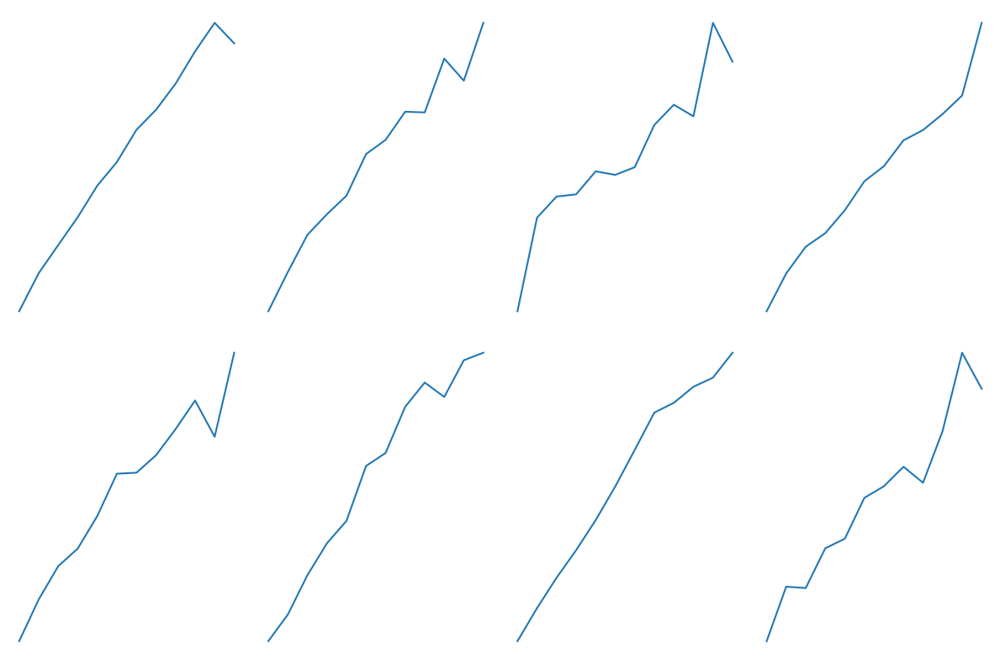

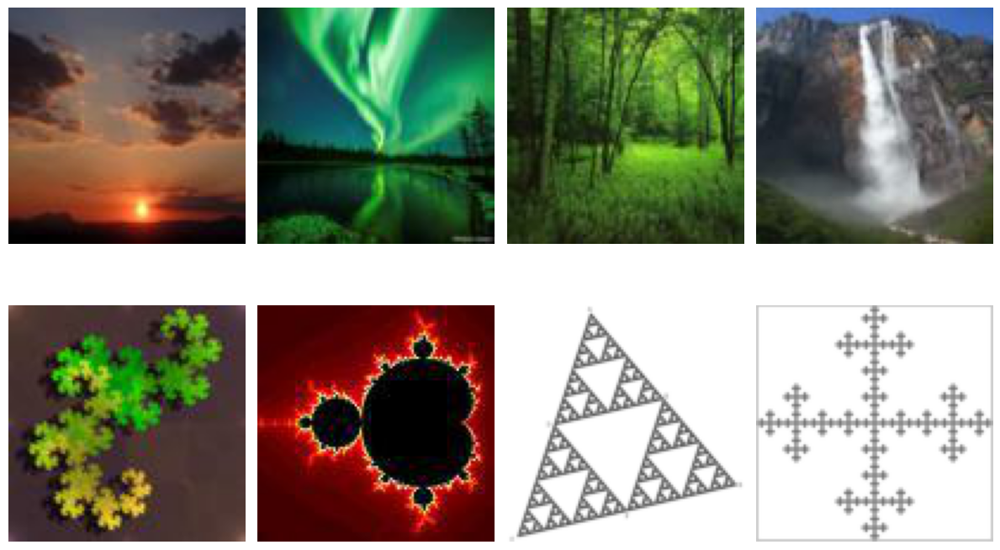

In [141]:
# Mostrar los gráficos del cluster 0
mostrar_graficos_cluster(cluster_graficos[0], list_images)
mostrar_imagenes_cluster(cluster_graficos[0], list_images)

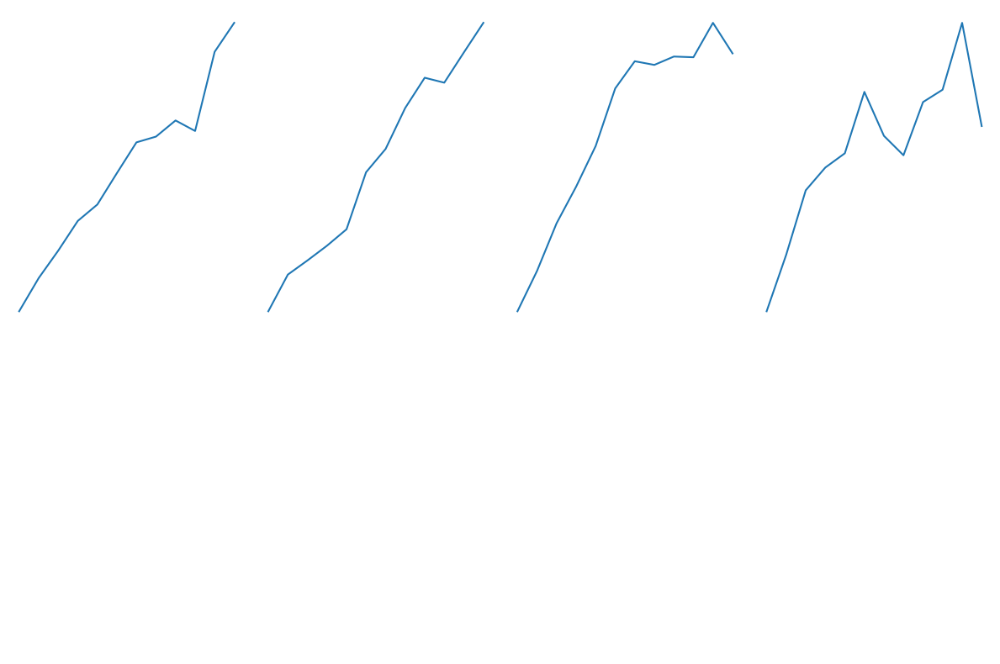

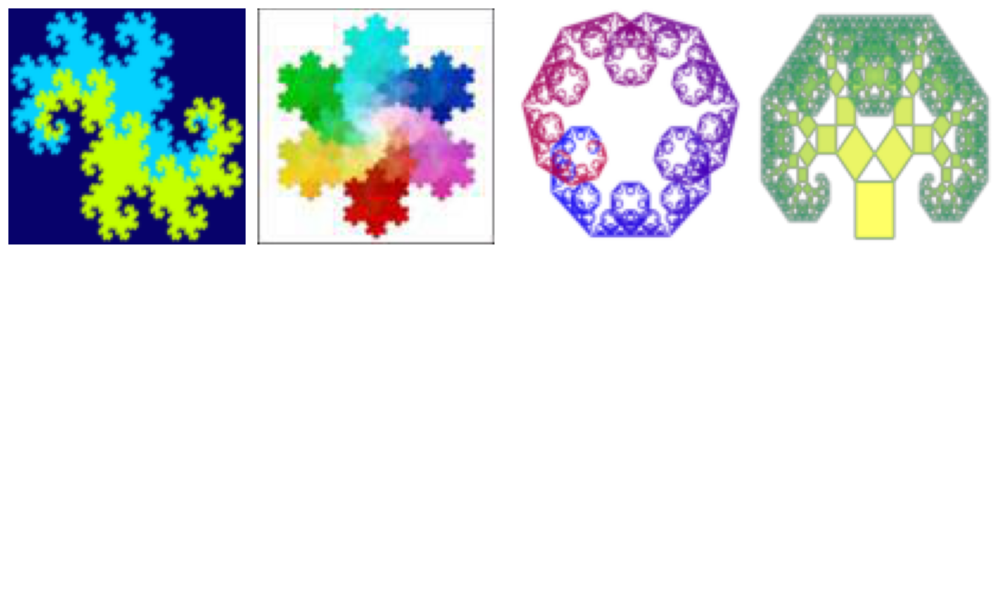

In [142]:
# Mostrar los gráficos del cluster 1
mostrar_graficos_cluster(cluster_graficos[1], list_images)
mostrar_imagenes_cluster(cluster_graficos[1], list_images)

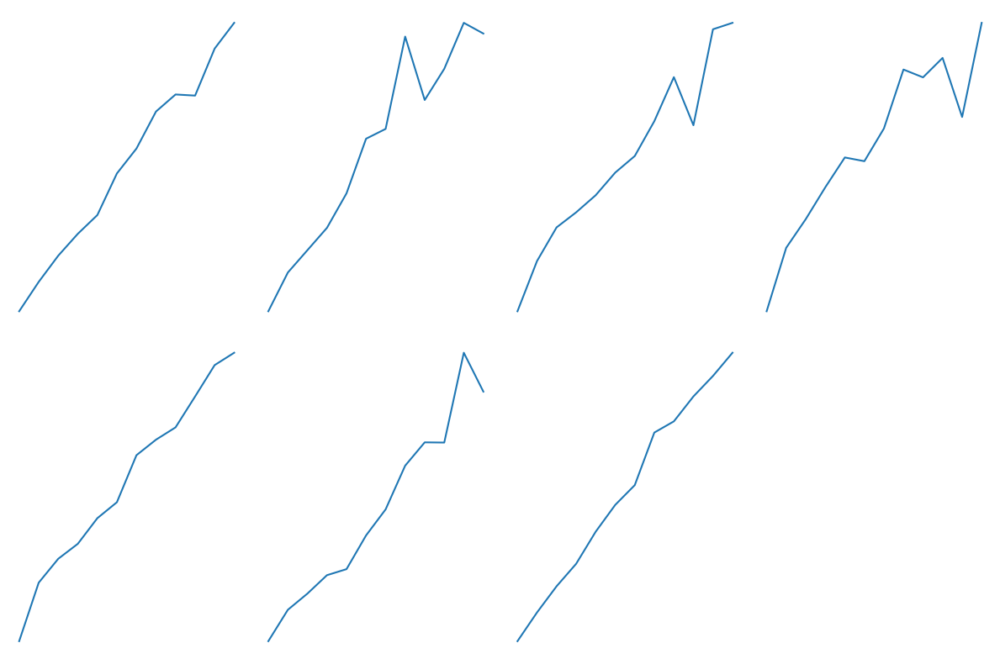

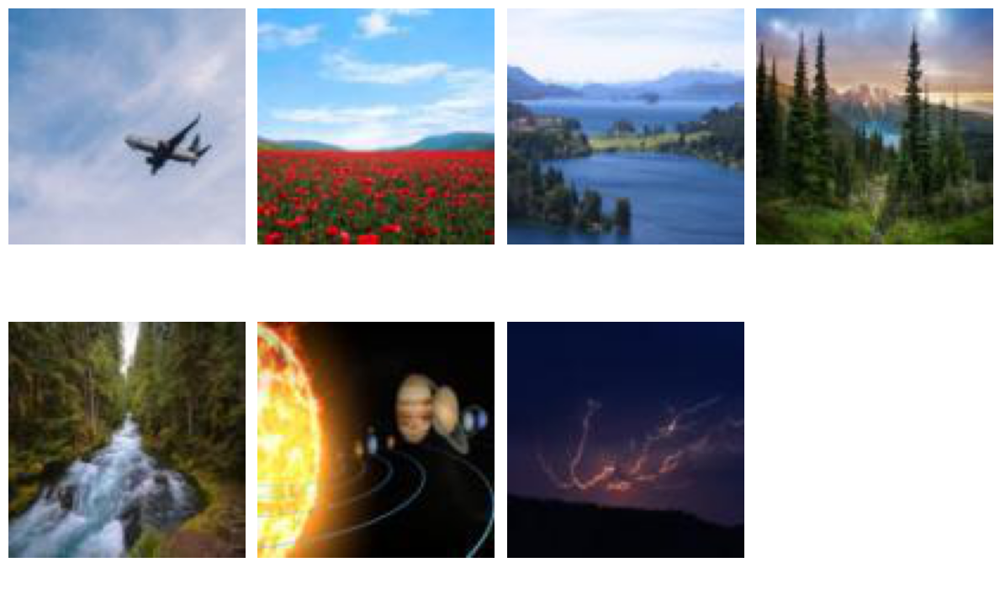

In [143]:
# Mostrar los gráficos del cluster 2
mostrar_graficos_cluster(cluster_graficos[2], list_images)
mostrar_imagenes_cluster(cluster_graficos[2], list_images)

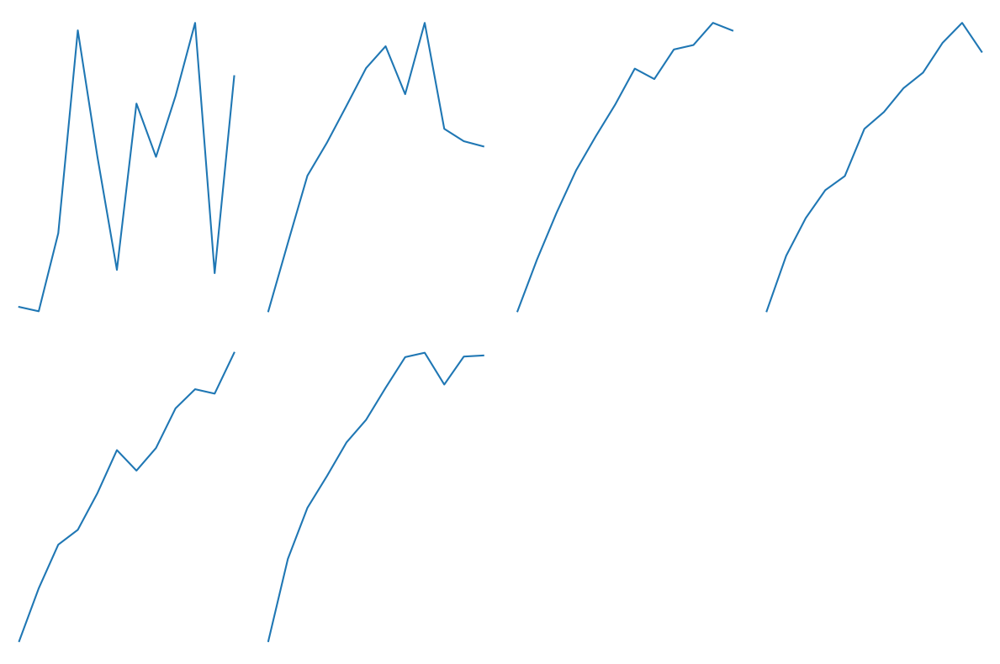

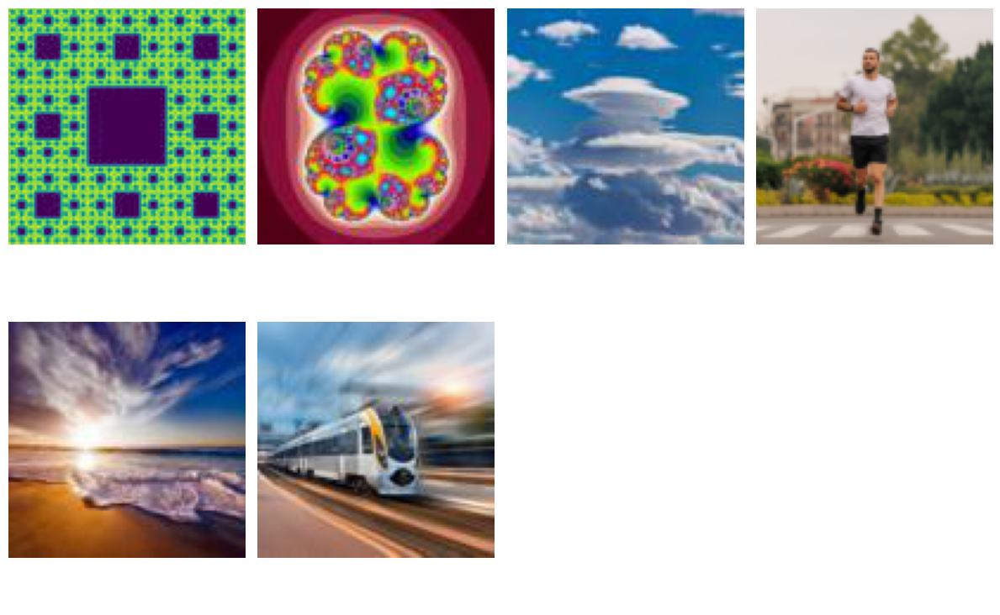

In [144]:
# Mostrar los gráficos del cluster 3
mostrar_graficos_cluster(cluster_graficos[3], list_images)
mostrar_imagenes_cluster(cluster_graficos[3], list_images)

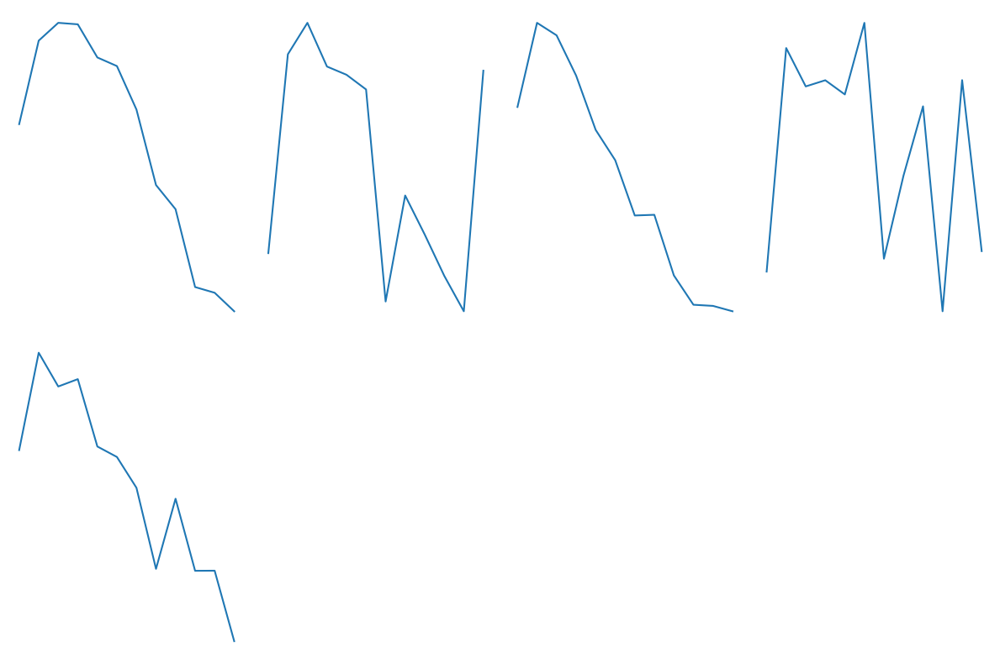

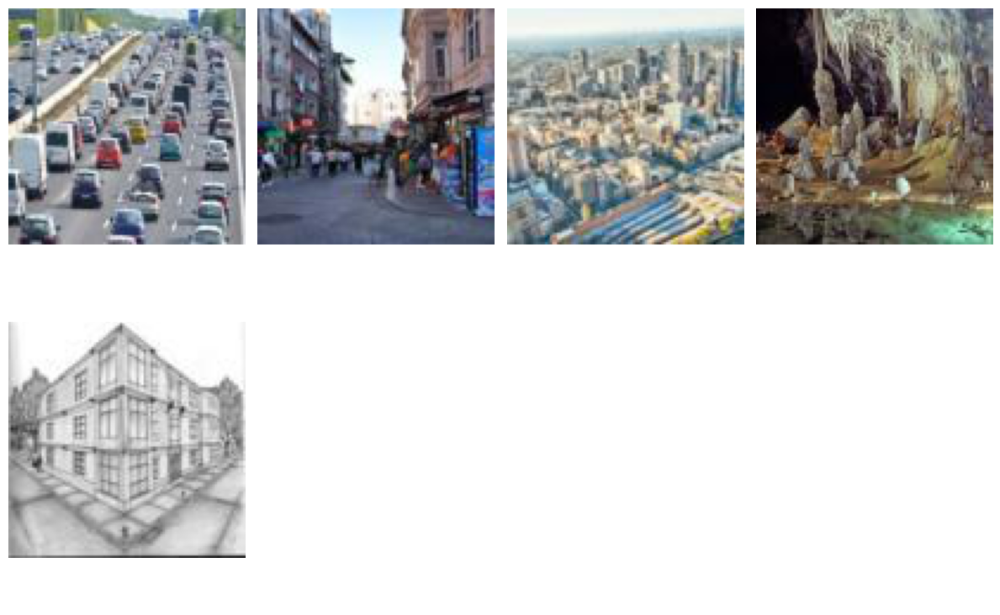

In [145]:
# Mostrar los gráficos del cluster 4
mostrar_graficos_cluster(cluster_graficos[4], list_images)
mostrar_imagenes_cluster(cluster_graficos[4], list_images)

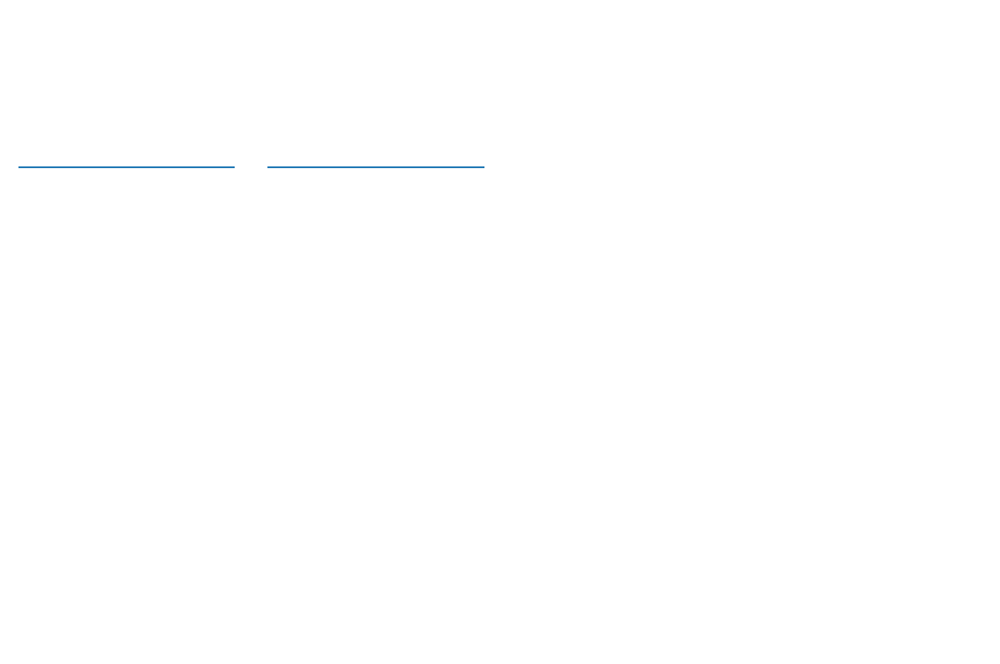

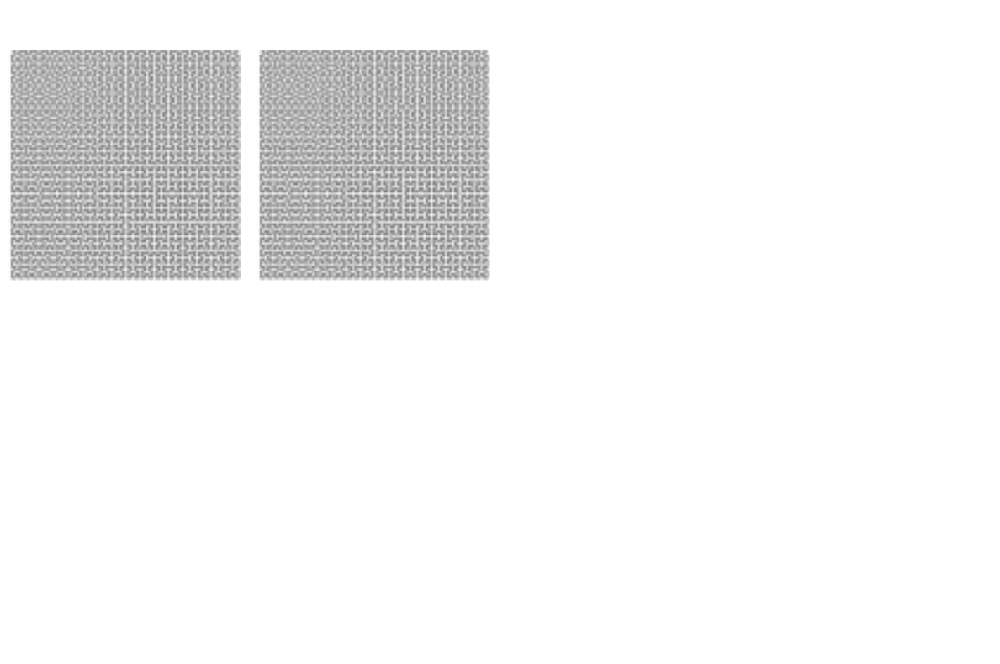

In [146]:
# Mostrar los gráficos del cluster 5
mostrar_graficos_cluster(cluster_graficos[5], list_images)
mostrar_imagenes_cluster(cluster_graficos[5], list_images)

### Hacemos un dataframe con las MSE de cada imagen.

In [147]:
data_dict = {'Image': list_images, 'Area': list_areas, '1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [], '11': [], '12': []}

for i in range(len(list_mse)):
    for j in range(len(list_mse[i])):
        data_dict[str(j + 1)].append(list_mse[i][j])

df_mse_values = pd.DataFrame(data_dict)
df_mse_values.to_csv(r'datos\2D\mse_values.csv', index=False)

### Rankeamos las imágenes según una función de pesos, y según su área:

#### 1) Función de pesos:

In [148]:
def image_score(entropy_list, weights):
    scale_entropy = np.array(entropy_list)
    mean_entropy = np.mean(scale_entropy)
    entropy_at_scale_10 = scale_entropy[9]
    entropy_variation = np.max(scale_entropy) - np.min(scale_entropy)
    entropy_stability = np.sum(np.abs(scale_entropy - np.mean(scale_entropy))) / np.sum(scale_entropy)
    
    score = (weights[0] * mean_entropy) + (weights[1] * entropy_at_scale_10) + (weights[2] * entropy_variation) + (weights[3] * entropy_stability)
    
    return score

In [149]:
weights = [0.35, 0.15, 0.25, 0.25]
df_score = pd.DataFrame(columns=['Image', 'Score'])
count = 0

for entropy_values_image in list_mse:
    score = image_score(entropy_values_image, weights)
    df_score.loc[count] = [list_images[count], score]
    count += 1

df_score.to_csv(r'datos\2D\score.csv', index=False)

<ipython-input-148-1a9dc64d508b>:6: RuntimeWarning: invalid value encountered in double_scalars
  entropy_stability = np.sum(np.abs(scale_entropy - np.mean(scale_entropy))) / np.sum(scale_entropy)


In [150]:
best_images = df_score.sort_values(by='Score', ascending=False).head(5)
best_images

,Image,Score
13,fractal_heighway_dragon.png,1.636180
17,fractal_levy_c_curve.png,1.587509
16,fractal_koch.jpg,1.564666
20,fractal_pythagoras_tree.png,1.412363
27,nubes.jpg,1.166148


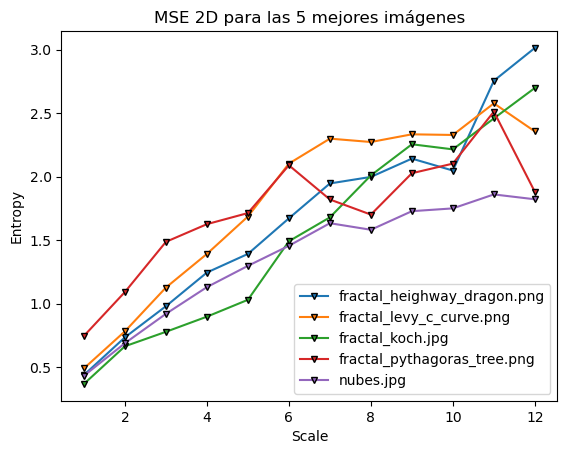

In [151]:
# Graficamos las MSE de las 5 mejores imágenes en un solo gráfico
for filename in best_images['Image']:
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    mse_values = list_mse[list_images.index(filename)]
    
    plt.plot(range(1, len(mse_values) + 1), mse_values, marker='v', markersize=5, markeredgecolor='black', label=filename)

plt.title('MSE 2D para las 5 mejores imágenes')
plt.xlabel('Scale')
plt.ylabel('Entropy')
plt.legend()
plt.show()

#### 2) Área:

In [152]:
best_images = df_mse_values.sort_values(by='Area', ascending=False).head(5)
best_images

,Image,Area,1,2,3,4,5,6,7,8,9,10,11,12
17,fractal_levy_c_curve.png,20.328182,0.491396,0.783153,1.127552,1.392395,1.686538,2.103082,2.299485,2.273030,2.333455,2.328403,2.577280,2.356222
20,fractal_pythagoras_tree.png,19.488295,0.746891,1.092596,1.487270,1.626453,1.713793,2.089753,1.820529,1.701661,2.027326,2.102899,2.512306,1.880527
11,fractal_cantor_set.jpg,18.958938,1.416614,1.407022,1.579089,2.026506,1.748535,1.498267,1.865080,1.747477,1.881786,2.043074,1.491016,1.925558
13,fractal_heighway_dragon.png,18.643410,0.439299,0.735721,0.980775,1.245807,1.392121,1.672348,1.946772,1.998165,2.142180,2.048301,2.754854,3.013432
16,fractal_koch.jpg,17.018978,0.369016,0.665410,0.779247,0.898391,1.031129,1.491929,1.679955,2.010221,2.255136,2.215107,2.458704,2.698481


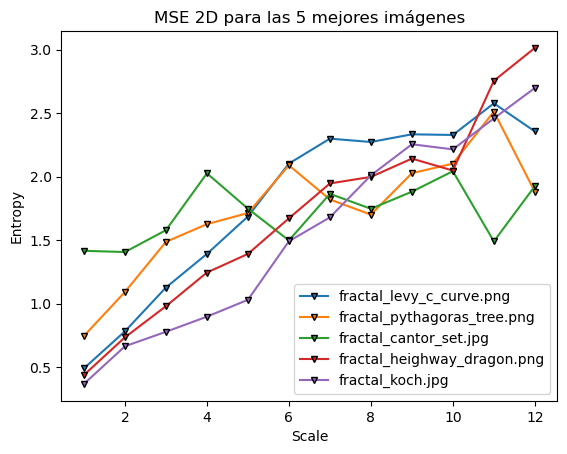

In [153]:
# Graficamos las MSE de las 5 mejores imágenes en un solo gráfico
for filename in best_images['Image']:
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    mse_values = list_mse[list_images.index(filename)]
    
    plt.plot(range(1, len(mse_values) + 1), mse_values, marker='v', markersize=5, markeredgecolor='black', label=filename)

plt.title('MSE 2D para las 5 mejores imágenes')
plt.xlabel('Scale')
plt.ylabel('Entropy')
plt.legend()
plt.show()

### II- Ahora, realizamos el mismo procedimiento anterior, pero con Fuzzy Entropy:

In [154]:
list_mse = []
list_images = []
list_areas = []

In [156]:
scales = 12
m = 1
r = 0.5
delta = 0.8
fuzzy = True
distance_type = 0

In [157]:
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    mse_values = mse_2D_one_image(file_path, scales, m, r, delta, fuzzy, distance_type)
    grafico_entropia = calcular_grafico_entropia_multiescala(mse_values)
    area = calcular_area_bajo_curva([i for i in range(1, scales+1)], mse_values)

    list_mse.append(mse_values)
    list_images.append(filename)
    list_areas.append(area)

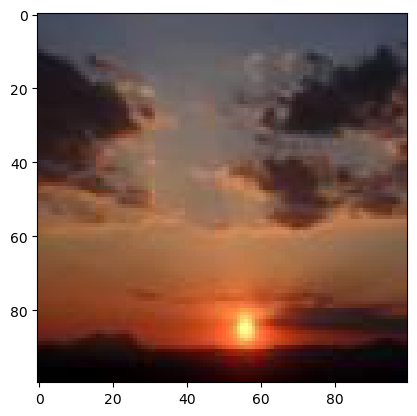

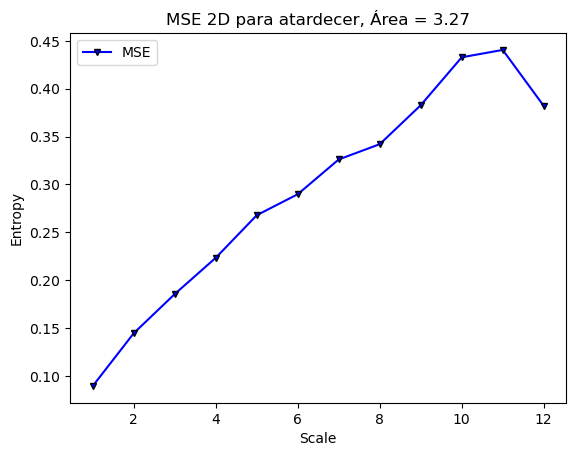

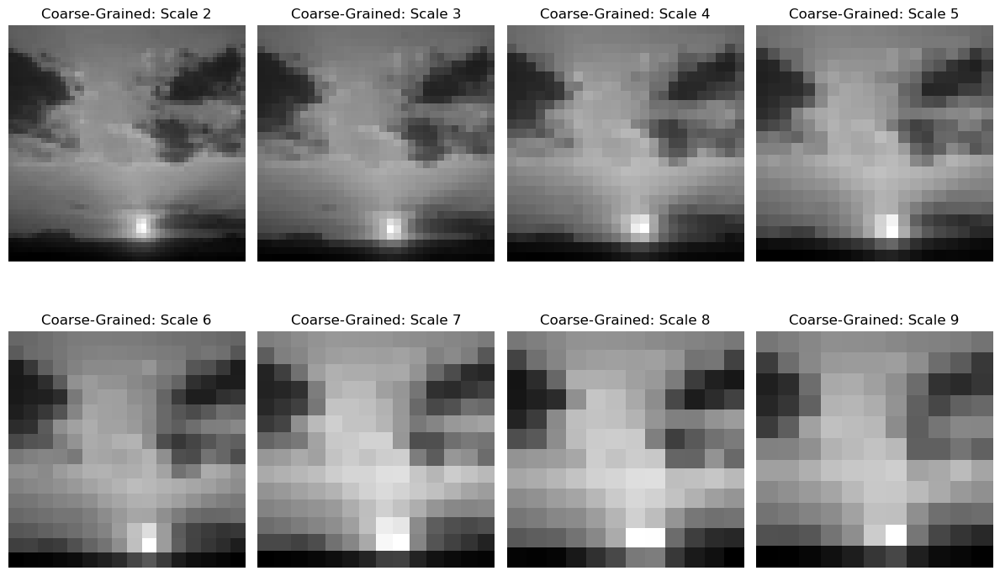

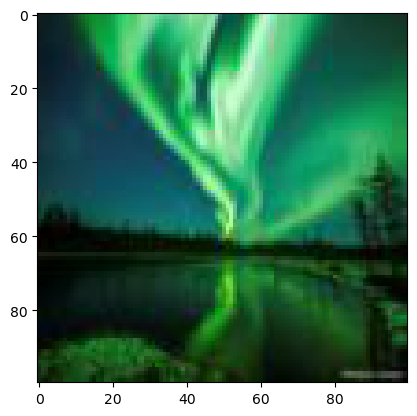

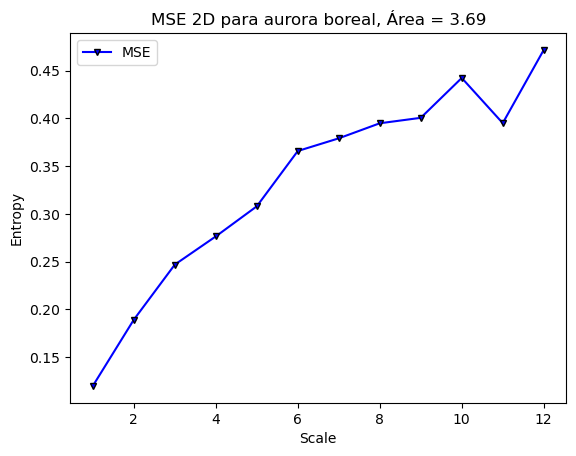

...

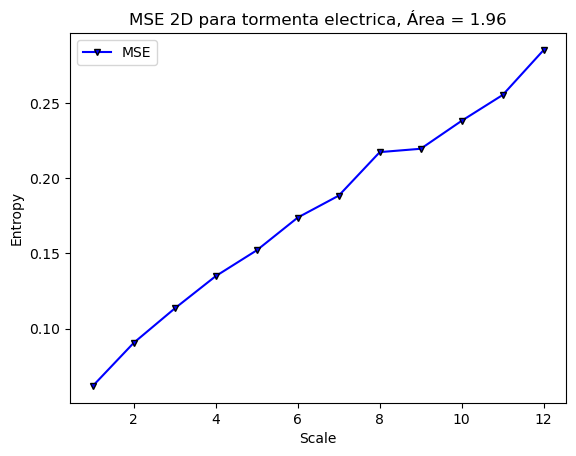

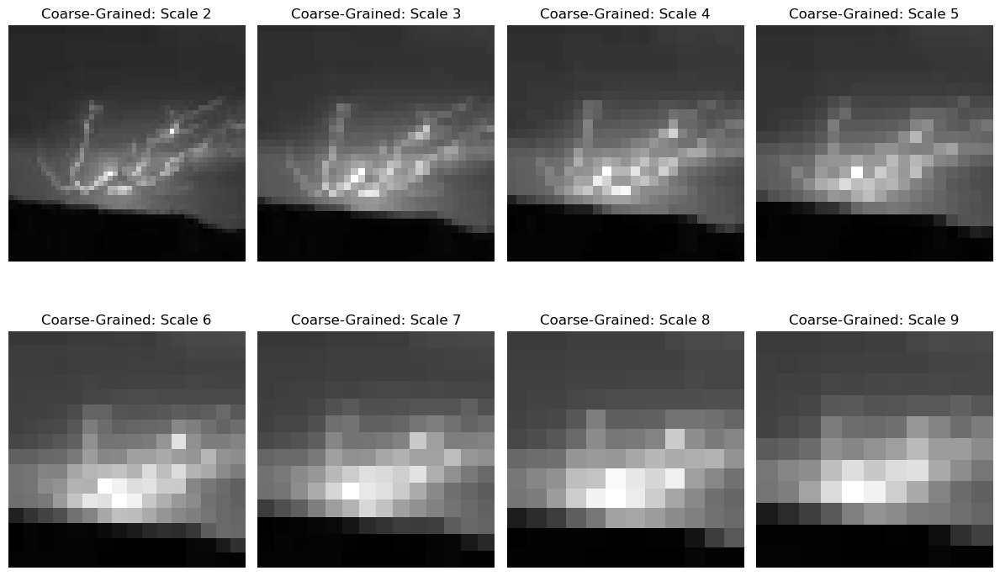

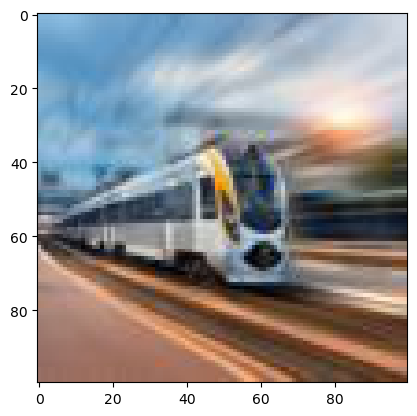

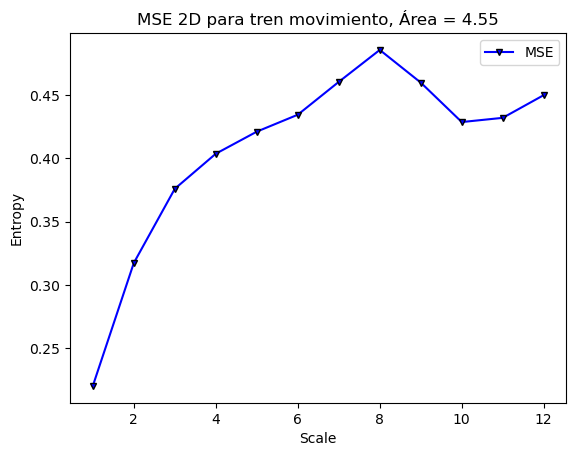

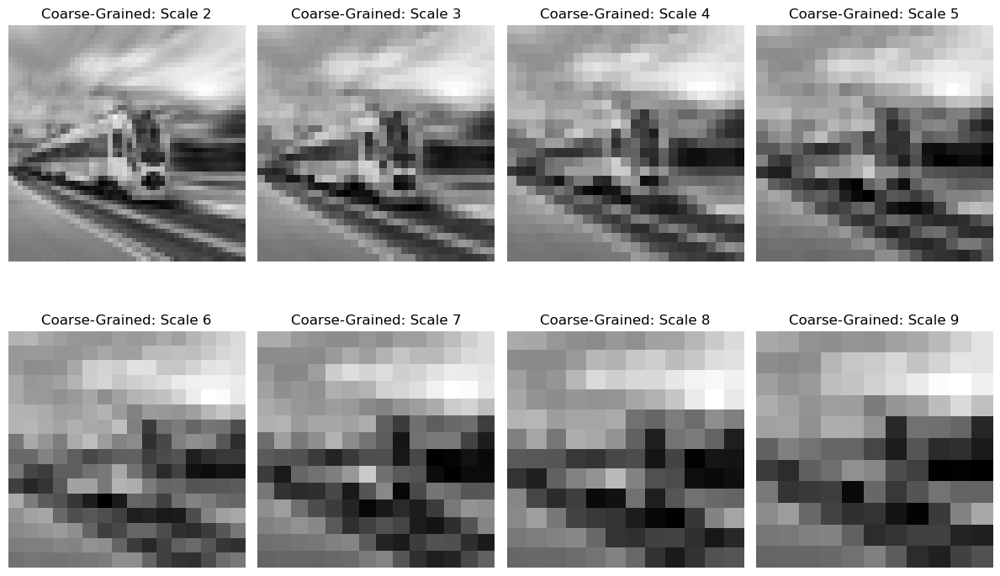

In [158]:
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    area = list_areas[list_images.index(filename)]
    mse_values = list_mse[list_images.index(filename)]
    
    plt.imshow(image)
    plt.show()

    plt.plot(range(1, len(mse_values) + 1), mse_values, color='blue', marker='v', markersize=5, markeredgecolor='black', label='MSE')

    name_title = filename.replace('.jpg', '')
    name_title = name_title.replace('.png', '')
    name_title = name_title.replace('.jpeg', '')
    name_title = name_title.replace('_', ' ')
    plt.title(f'MSE 2D para {name_title}, Área = {area:.2f}')

    plt.xlabel('Scale')
    plt.ylabel('Entropy')
    plt.legend()
    plt.show()
    
    # Cerrar la ventana de la imagen para continuar con la siguiente
    plt.close()

    plot_coarse_grained_image(image, scales)

### Agrupación de gráficos con comportamiento similar

In [159]:
# Gráficos con su respectiva imagen
list_images_mse = list(zip(list_images, list_mse))
cluster_graficos = graph_clustering(list_mse, 6)

c:\Users\adolf\anaconda3\envs\Geopandas\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\adolf\anaconda3\envs\Geopandas\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


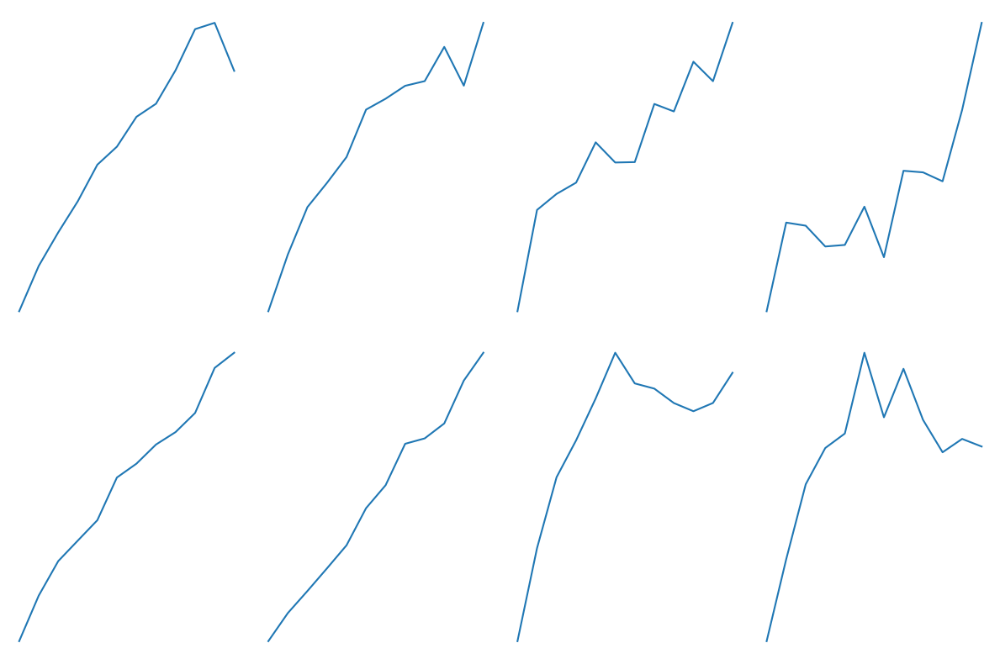

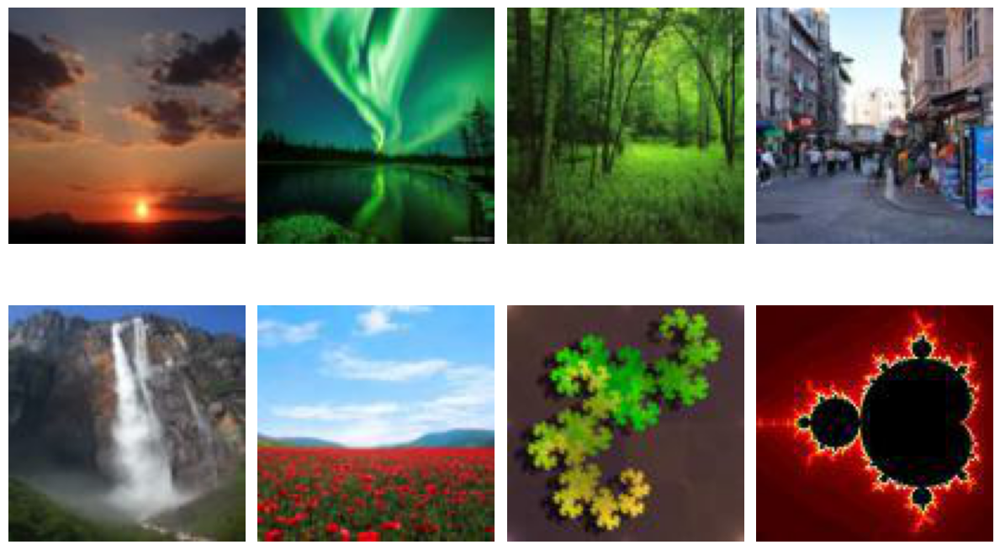

In [160]:
# Mostrar los gráficos del cluster 0
mostrar_graficos_cluster(cluster_graficos[0], list_images)
mostrar_imagenes_cluster(cluster_graficos[0], list_images)

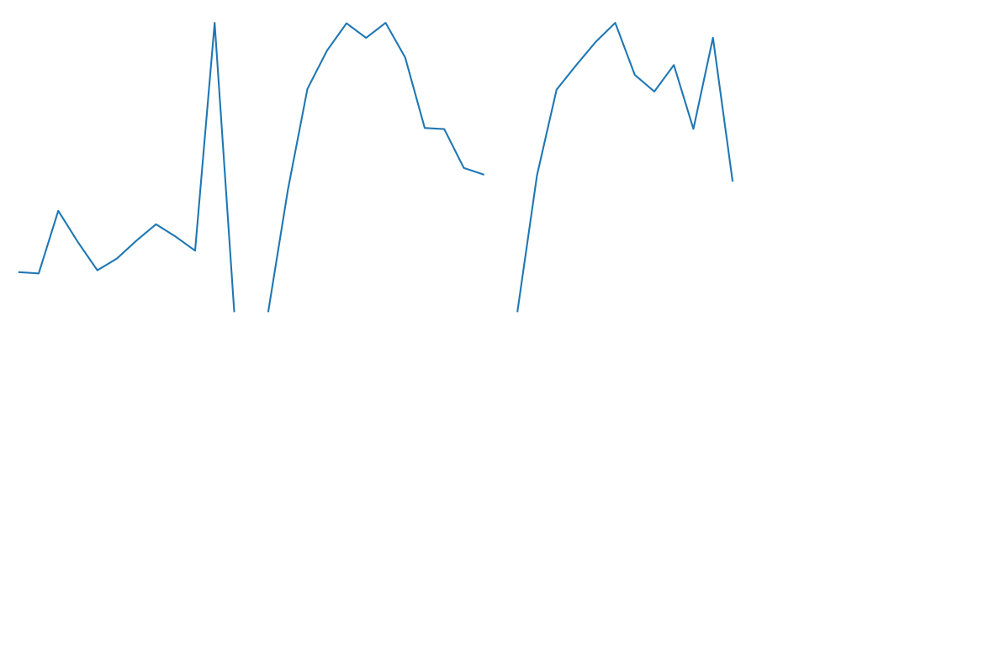

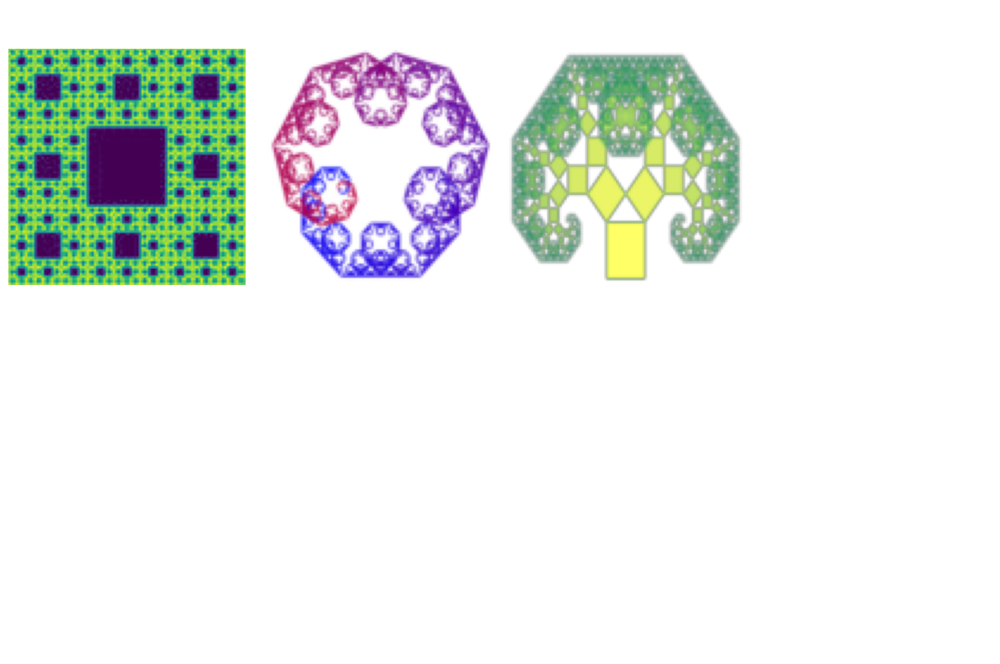

In [161]:
# Mostrar los gráficos del cluster 1
mostrar_graficos_cluster(cluster_graficos[1], list_images)
mostrar_imagenes_cluster(cluster_graficos[1], list_images)

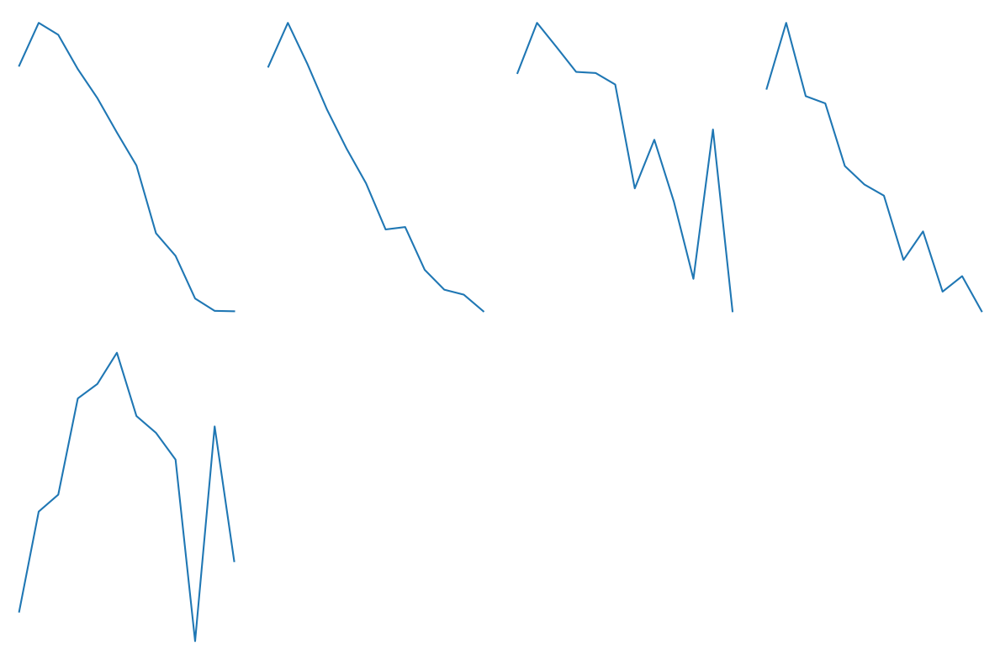

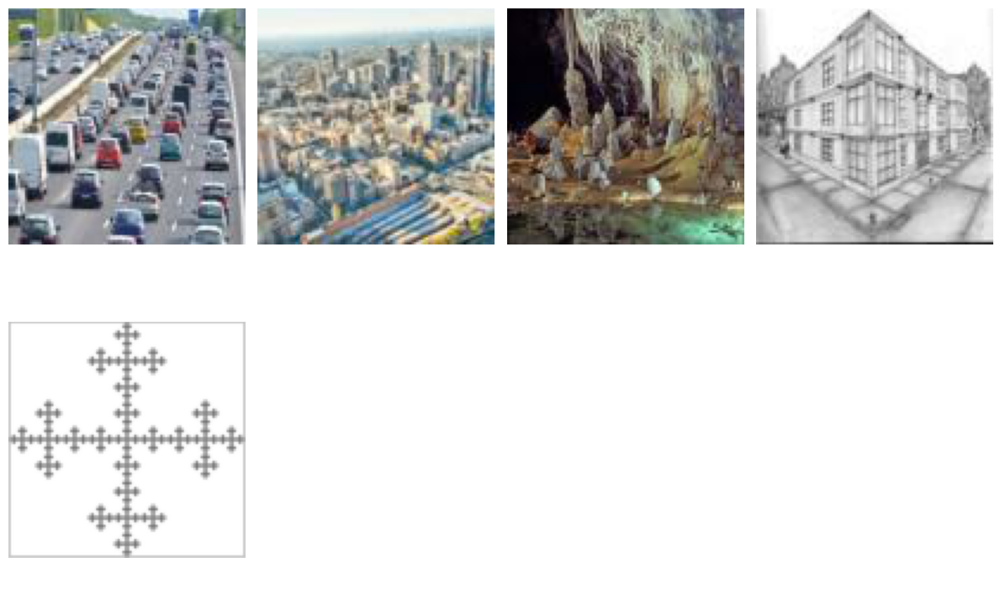

In [162]:
# Mostrar los gráficos del cluster 2
mostrar_graficos_cluster(cluster_graficos[2], list_images)
mostrar_imagenes_cluster(cluster_graficos[2], list_images)

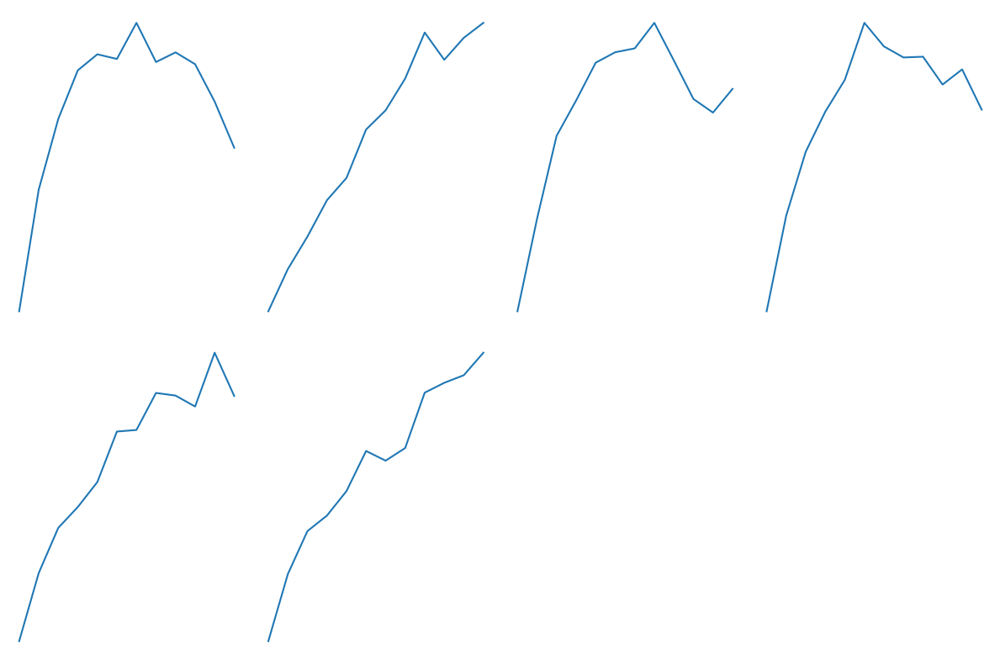

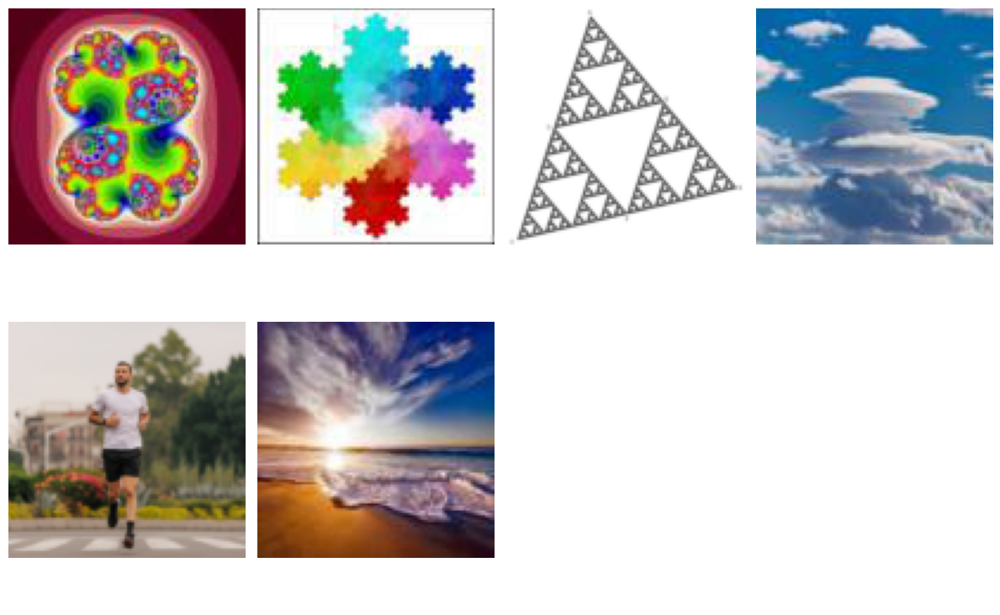

In [163]:
# Mostrar los gráficos del cluster 3
mostrar_graficos_cluster(cluster_graficos[3], list_images)
mostrar_imagenes_cluster(cluster_graficos[3], list_images)

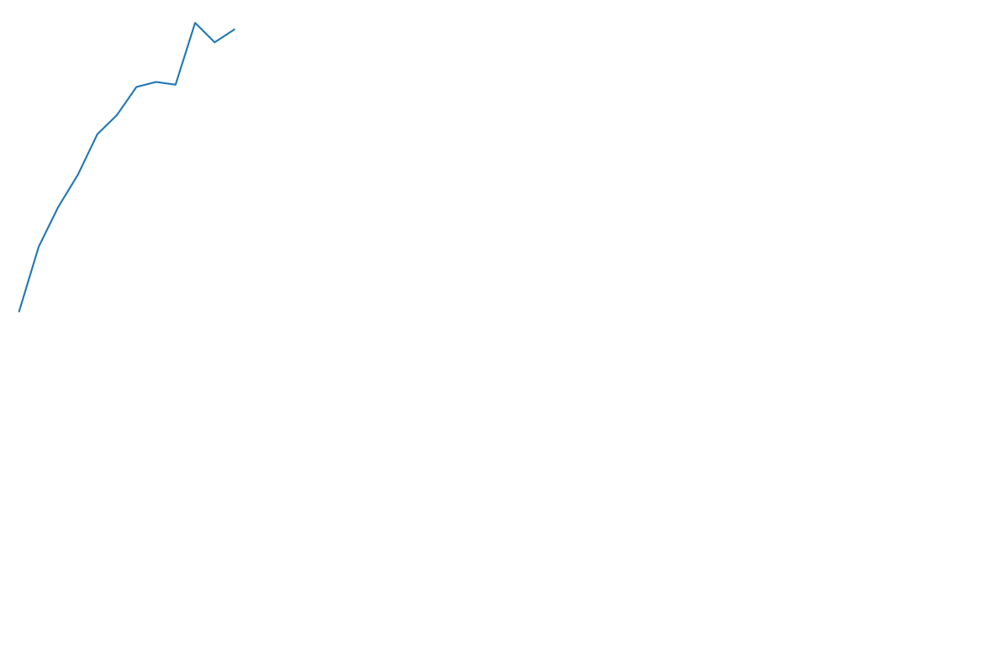

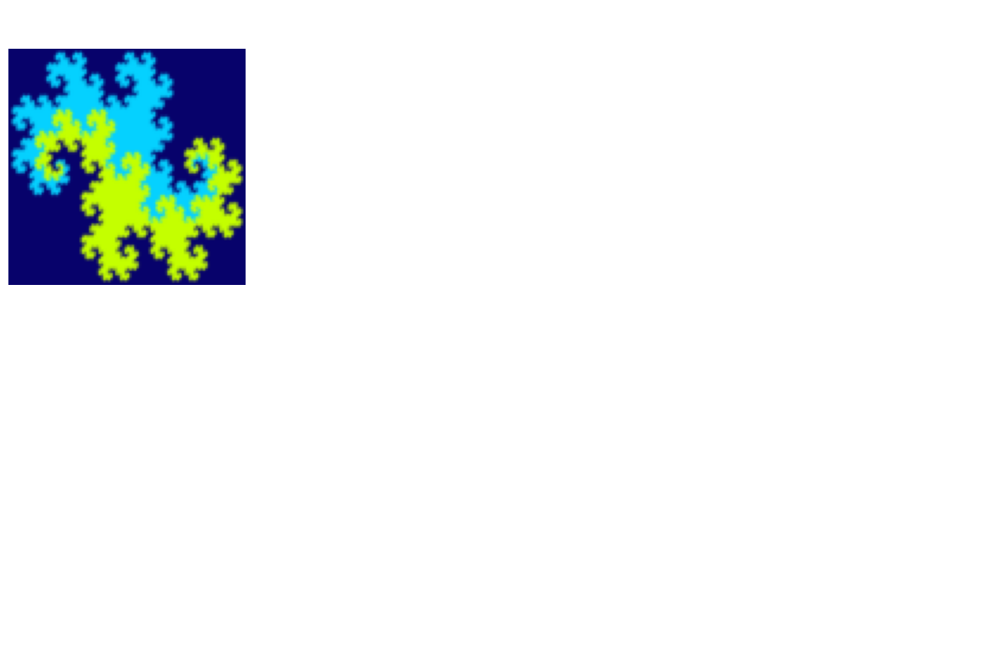

In [164]:
# Mostrar los gráficos del cluster 4
mostrar_graficos_cluster(cluster_graficos[4], list_images)
mostrar_imagenes_cluster(cluster_graficos[4], list_images)

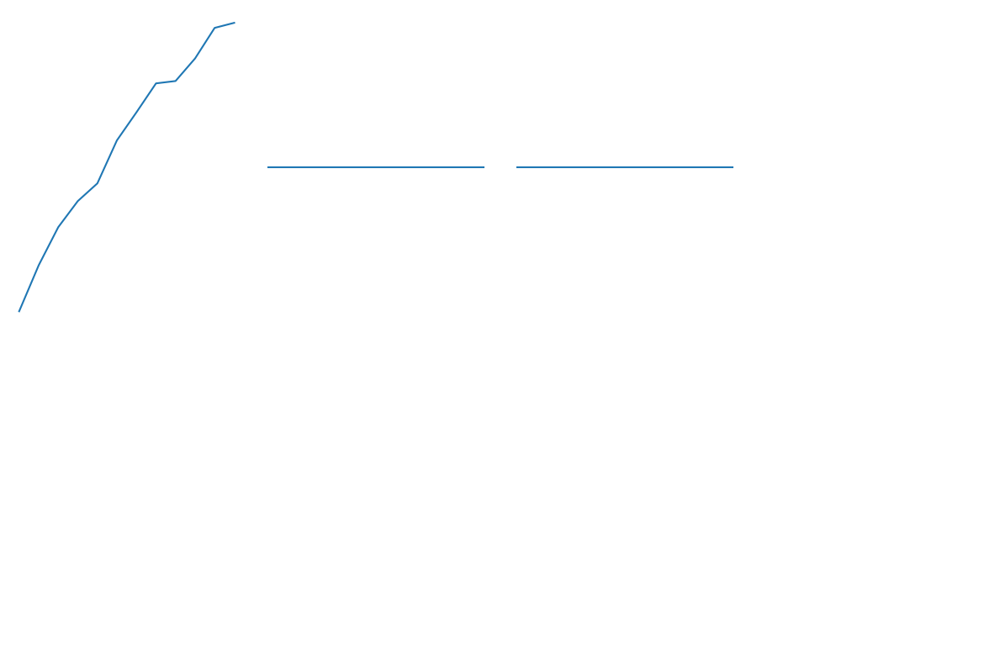

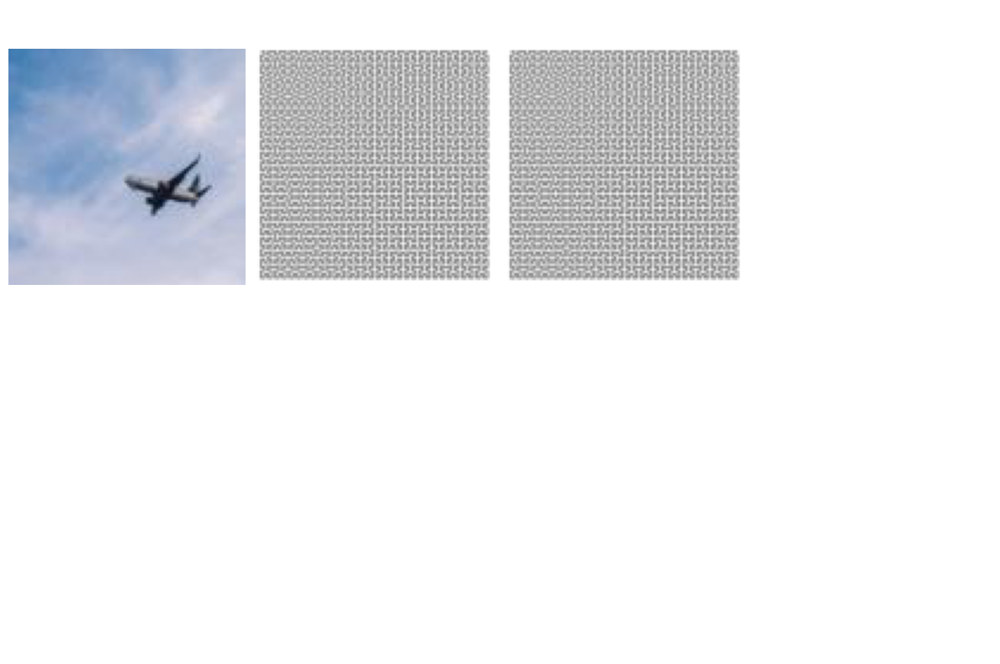

In [165]:
# Mostrar los gráficos del cluster 5
mostrar_graficos_cluster(cluster_graficos[5], list_images)
mostrar_imagenes_cluster(cluster_graficos[5], list_images)

In [166]:
data_dict = {'Image': list_images, 'Area': list_areas, '1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [], '11': [], '12': []}

for i in range(len(list_mse)):
    for j in range(len(list_mse[i])):
        data_dict[str(j + 1)].append(list_mse[i][j])

df_mse_values_2 = pd.DataFrame(data_dict)
df_mse_values_2.to_csv(r'datos\2D\mse_values_2.csv', index=False)

#### 1) Función de pesos:

In [167]:
weights = [0.35, 0.15, 0.25, 0.25]
df_score_2 = pd.DataFrame(columns=['Image', 'Score'])
count = 0

for entropy_values_image in list_mse:
    score = image_score(entropy_values_image, weights)
    df_score_2.loc[count] = [list_images[count], score]
    count += 1

df_score_2.to_csv(r'datos\2D\score_2.csv', index=False)

<ipython-input-148-1a9dc64d508b>:6: RuntimeWarning: invalid value encountered in double_scalars
  entropy_stability = np.sum(np.abs(scale_entropy - np.mean(scale_entropy))) / np.sum(scale_entropy)


In [168]:
best_images = df_score_2.sort_values(by='Score', ascending=False).head(5)
best_images

,Image,Score
13,fractal_heighway_dragon.png,0.892902
11,fractal_cantor_set.jpg,0.635450
16,fractal_koch.jpg,0.614303
17,fractal_levy_c_curve.png,0.493705
20,fractal_pythagoras_tree.png,0.493301


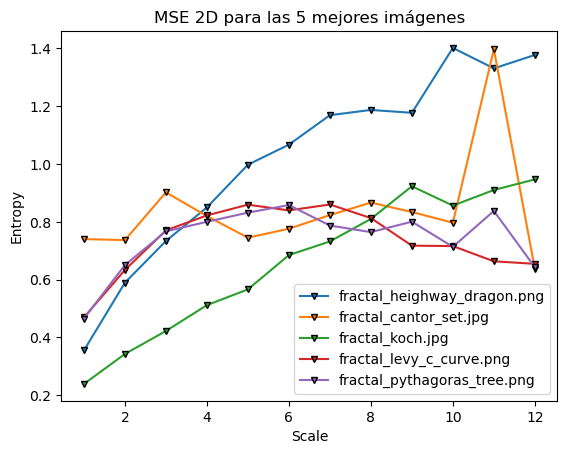

In [169]:
# Graficamos las MSE de las 5 mejores imágenes en un solo gráfico
for filename in best_images['Image']:
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    mse_values = list_mse[list_images.index(filename)]
    
    plt.plot(range(1, len(mse_values) + 1), mse_values, marker='v', markersize=5, markeredgecolor='black', label=filename)
    
plt.title('MSE 2D para las 5 mejores imágenes')
plt.xlabel('Scale')
plt.ylabel('Entropy')
plt.legend()
plt.show()

#### 2) Área:

In [170]:
best_images = df_mse_values_2.sort_values(by='Area', ascending=False).head(5)
best_images

,Image,Area,1,2,3,4,5,6,7,8,9,10,11,12
13,fractal_heighway_dragon.png,11.368418,0.355150,0.589403,0.733604,0.849921,0.997459,1.066887,1.168805,1.186949,1.177048,1.401493,1.330738,1.377072
11,fractal_cantor_set.jpg,9.385837,0.740162,0.736789,0.901865,0.819806,0.745134,0.776040,0.823292,0.866392,0.833952,0.796814,1.397103,0.637138
20,fractal_pythagoras_tree.png,8.364219,0.465383,0.650576,0.766885,0.800096,0.831827,0.857820,0.787033,0.764347,0.800429,0.713453,0.837554,0.643015
17,fractal_levy_c_curve.png,8.256581,0.469311,0.633623,0.770400,0.822169,0.859238,0.839489,0.859865,0.812972,0.717497,0.715991,0.663399,0.654565
16,fractal_koch.jpg,7.352112,0.239200,0.342811,0.422344,0.511710,0.566270,0.684943,0.732089,0.809991,0.922906,0.856025,0.910062,0.946721


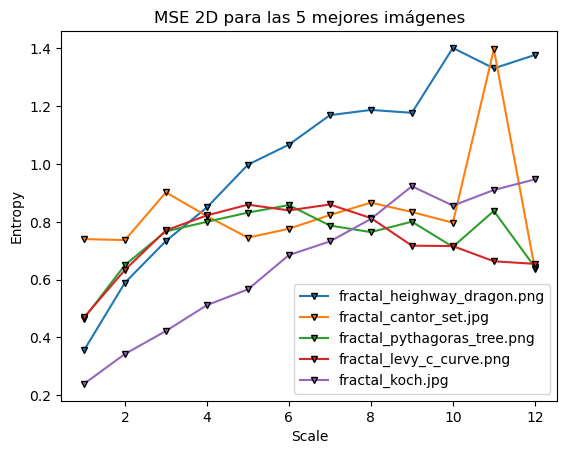

In [171]:
# Graficamos las MSE de las 5 mejores imágenes en un solo gráfico
for filename in best_images['Image']:
    file_path = os.path.join(folder_path, filename)
    image = io.imread(file_path)
    
    mse_values = list_mse[list_images.index(filename)]
    
    plt.plot(range(1, len(mse_values) + 1), mse_values, marker='v', markersize=5, markeredgecolor='black', label=filename)

plt.title('MSE 2D para las 5 mejores imágenes')
plt.xlabel('Scale')
plt.ylabel('Entropy')
plt.legend()
plt.show()